## 1. HR Analytics for Predicting Attrition

In the dynamic world of business, employee turnover can be a costly and disruptive force. Imagine losing key talent, facing knowledge gaps, and navigating onboarding costs - all while striving to maintain productivity and client satisfaction. This is where employee attrition prediction comes in, playing a crucial role in proactively identifying and mitigating potential departures.<br>

<img src="https://th.bing.com/th/id/OIG1.tCw9Mir0dY6rr0vVxc40?w=1024&h=1024&rs=1&pid=ImgDetMain" alt="Employees">

This project delves into the fascinating realm of machine learning to create a model capable of predicting employee flight risk. We'll leverage historical data containing various employee characteristics and job variables to paint a picture of who might be at risk of leaving the company. By understanding the driving factors behind attrition, we can implement targeted strategies to retain our valuable workforce, fostering a thriving and engaged environment.<br><br>

Project significance:

<b>Reduced Turnover Costs:</b> By identifying potential leavers, we can proactively address their concerns and offer incentives, minimizing costly replacements and disruptions.<br>
<b>Improved Talent Management:</b> Understanding attrition patterns allows us to tailor retention strategies to specific employee groups, leading to a more engaged and satisfied workforce.<br>
<b>Enhanced Decision-Making:</b> Data-driven insights empower strategic personnel decisions around talent acquisition, development, and career progression, fostering a future-proof workforce.

In [ ]:
# Nessesary imports

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport as pp
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import Perceptron

In [2]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

## 2. Data Loading

It is essential to understand the type of data that we are working with and hence we list down a sample for preview. It reveals that the data has 35 tuples: 

<code>Age</code>
<code>Attrition</code>
<code>BusinessTravel</code>
<code>DailyRate</code>
<code>Department</code>
<code>DistanceFromHome</code>
<code>Education</code>
<code>EducationField</code>
<code>EmployeeCount</code>
<code>EmployeeNumber</code>
<code>EnvironmentSatisfaction</code>
<code>Gender</code>
<code>HourlyRate</code>
<code>JobInvolvement</code>
<code>JobLevel</code>
<code>JobRole</code>
<code>JobSatisfaction</code>
<code>MaritalStatus</code>
<code>MonthlyIncome</code>
<code>MonthlyRate</code>
<code>NumCompaniesWorked</code>
<code>Over18</code>
<code>OverTime</code>
<code>PercentSalaryHike</code>
<code>PerformanceRating</code>
<code>RelationshipSatisfaction</code>
<code>StandardHours</code>
<code>StockOptionLevel</code>
<code>TotalWorkingYears</code>
<code>TrainingTimesLastYear</code>
<code>WorkLifeBalance</code>
<code>YearsAtCompany</code>
<code>YearsInCurrentRole</code>
<code>YearsSinceLastPromotion</code>
<code>YearsWithCurrManager</code>


In [3]:
df = pd.read_csv('HR-Employee-Attrition.csv') 

df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


This is a fictional data set created by IBM data scientists.

In [4]:
df.columns = [x.lower() for x in df.columns]
df.columns = [x.replace(' ', '_') for x in df.columns]
df.columns = [x.replace('-', '_') for x in df.columns]

In [5]:
# Checking the shape of the dataset

df.shape

(1470, 35)

In [6]:
# Checking the columns of the dataset

df.columns

Index(['age', 'attrition', 'businesstravel', 'dailyrate', 'department',
       'distancefromhome', 'education', 'educationfield', 'employeecount',
       'employeenumber', 'environmentsatisfaction', 'gender', 'hourlyrate',
       'jobinvolvement', 'joblevel', 'jobrole', 'jobsatisfaction',
       'maritalstatus', 'monthlyincome', 'monthlyrate', 'numcompaniesworked',
       'over18', 'overtime', 'percentsalaryhike', 'performancerating',
       'relationshipsatisfaction', 'standardhours', 'stockoptionlevel',
       'totalworkingyears', 'trainingtimeslastyear', 'worklifebalance',
       'yearsatcompany', 'yearsincurrentrole', 'yearssincelastpromotion',
       'yearswithcurrmanager'],
      dtype='object')

In [7]:
# Checking the data types of the columns
df.dtypes

age                          int64
attrition                   object
businesstravel              object
dailyrate                    int64
department                  object
distancefromhome             int64
education                    int64
educationfield              object
employeecount                int64
employeenumber               int64
environmentsatisfaction      int64
gender                      object
hourlyrate                   int64
jobinvolvement               int64
joblevel                     int64
jobrole                     object
jobsatisfaction              int64
maritalstatus               object
monthlyincome                int64
monthlyrate                  int64
numcompaniesworked           int64
over18                      object
overtime                    object
percentsalaryhike            int64
performancerating            int64
relationshipsatisfaction     int64
standardhours                int64
stockoptionlevel             int64
totalworkingyears   

In [8]:
df.describe()

,age,dailyrate,distancefromhome,education,employeecount,employeenumber,environmentsatisfaction,hourlyrate,jobinvolvement,joblevel,...,relationshipsatisfaction,standardhours,stockoptionlevel,totalworkingyears,trainingtimeslastyear,worklifebalance,yearsatcompany,yearsincurrentrole,yearssincelastpromotion,yearswithcurrmanager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,...,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,...,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,...,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


## 3. Performing EDA

We perform Exploratory Data Analysis (EDA) for investigating and understanding data through various techniques. It's like peeking under the hood to see what makes your data tick! Essentially, we're exploring and summarizing the key characteristics of our data to:

<li>Identify patterns and trends</li>
<li>Uncover anomalies and outliers</li>
<li>Check for data quality and integrity</li>
<li>Inform further analysis and modeling</li>


The profile report further genrates the following sections: 
1. Overview: This is like a quick first impression of your data. It provides key statistics like the number of rows and columns, data types present, presence of missing values and duplicates, and the overall size of the dataset in memory. Think of it as a high-level snapshot of your data's basic characteristics.

2. Variables: This section dives deeper into each individual variable. You'll see details like the variable type, unique values and their frequencies, descriptive statistics like mean, median, and standard deviation, extreme values, and even a histogram and boxplot to visualize the distribution. It's like getting a magnifying glass for each variable to understand its individual properties.

3. Interactions: This section explores the relationships between pairs of variables. It uses scatter plots to visually show how two variables might be correlated, revealing potential trends or patterns. Think of it as identifying the friends and foes within your data, variables that influence each other in interesting ways.

4. Correlations: This section takes the analysis of relationships a step further by calculating correlation coefficients between all pairs of variables. It uses heatmaps to present these correlations, highlighting strong positive or negative relationships that might be crucial for further analysis. It's like a map of connections, revealing the hidden networks woven within your data.

5. Missing Values: This section focuses on the pesky missing data points. It shows the count and percentage of missing values for each variable, allowing you to identify areas where data might be incomplete and consider how to handle missingness before diving deeper. Think of it as a treasure map, guiding you towards the missing pieces of your data puzzle.

6. Sample: Finally, this section gives you a sneak peek into the actual data by providing a glimpse of the first and last few rows. It's like a quick sampler platter, giving you a taste of the actual data itself before you dig into the full course analysis.

In [9]:
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26]),
 [Text(1, 0, 'age'),
  Text(2, 0, 'dailyrate'),
  Text(3, 0, 'distancefromhome'),
  Text(4, 0, 'education'),
  Text(5, 0, 'employeecount'),
  Text(6, 0, 'employeenumber'),
  Text(7, 0, 'environmentsatisfaction'),
  Text(8, 0, 'hourlyrate'),
  Text(9, 0, 'jobinvolvement'),
  Text(10, 0, 'joblevel'),
  Text(11, 0, 'jobsatisfaction'),
  Text(12, 0, 'monthlyincome'),
  Text(13, 0, 'monthlyrate'),
  Text(14, 0, 'numcompaniesworked'),
  Text(15, 0, 'percentsalaryhike'),
  Text(16, 0, 'performancerating'),
  Text(17, 0, 'relationshipsatisfaction'),
  Text(18, 0, 'standardhours'),
  Text(19, 0, 'stockoptionlevel'),
  Text(20, 0, 'totalworkingyears'),
  Text(21, 0, 'trainingtimeslastyear'),
  Text(22, 0, 'worklifebalance'),
  Text(23, 0, 'yearsatcompany'),
  Text(24, 0, 'yearsincurrentrole'),
  Text(25, 0, 'yearssincelastpromotion'),
  Text(26, 0, 'yearswithcurrmanager')])

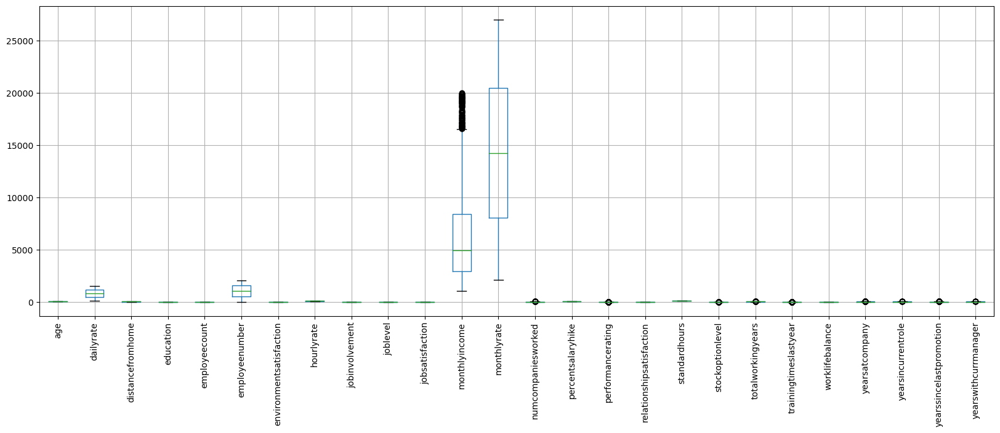

In [10]:
# Cheking for outliers

df.boxplot(figsize=(20,8))
plt.subplots_adjust(bottom=0.25)
plt.xticks(rotation=90)

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26]),
 [Text(1, 0, 'age'),
  Text(2, 0, 'dailyrate'),
  Text(3, 0, 'distancefromhome'),
  Text(4, 0, 'education'),
  Text(5, 0, 'employeecount'),
  Text(6, 0, 'employeenumber'),
  Text(7, 0, 'environmentsatisfaction'),
  Text(8, 0, 'hourlyrate'),
  Text(9, 0, 'jobinvolvement'),
  Text(10, 0, 'joblevel'),
  Text(11, 0, 'jobsatisfaction'),
  Text(12, 0, 'monthlyincome'),
  Text(13, 0, 'monthlyrate'),
  Text(14, 0, 'numcompaniesworked'),
  Text(15, 0, 'percentsalaryhike'),
  Text(16, 0, 'performancerating'),
  Text(17, 0, 'relationshipsatisfaction'),
  Text(18, 0, 'standardhours'),
  Text(19, 0, 'stockoptionlevel'),
  Text(20, 0, 'totalworkingyears'),
  Text(21, 0, 'trainingtimeslastyear'),
  Text(22, 0, 'worklifebalance'),
  Text(23, 0, 'yearsatcompany'),
  Text(24, 0, 'yearsincurrentrole'),
  Text(25, 0, 'yearssincelastpromotion'),
  Text(26, 0, 'yearswithcurrmanager')])

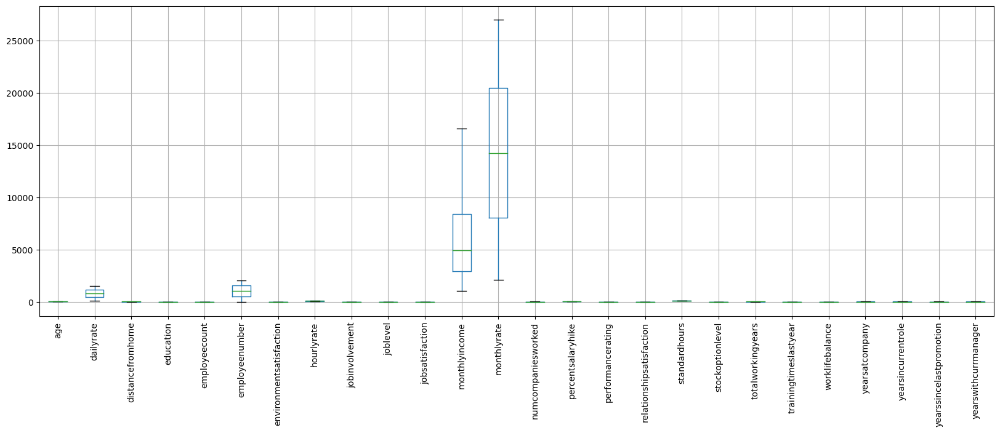

In [11]:
# removing outliers 

for i in df.columns:
    if df[i].dtype == 'int64':
        q1 = df[i].quantile(0.25)
        q3 = df[i].quantile(0.75)
        iqr = q3 - q1
        low = q1 - 1.5*iqr
        high = q3 + 1.5*iqr
        df[i] = df[i].clip(lower=low, upper=high)

# Checking for outliers again

df.boxplot(figsize=(20,8))
plt.subplots_adjust(bottom=0.25)
plt.xticks(rotation=90)

In [12]:
# Dropping the columns which are not required

df.drop(['employeecount', 'employeenumber', 'standardhours'], axis=1, inplace=True)

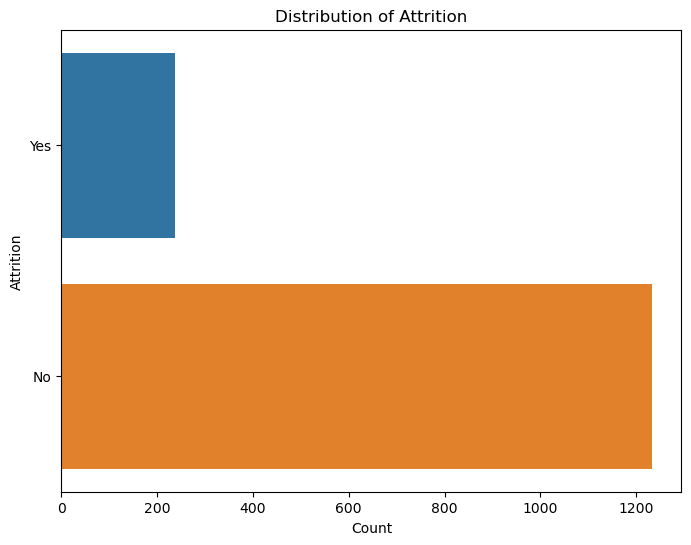

In [14]:
# Data Visualization

# Checking the distribution of the target variable

plt.figure(figsize=(8, 6))
sns.countplot(data=df, y='attrition')
plt.xlabel('Count')
plt.ylabel('Attrition')
plt.title('Distribution of Attrition')
plt.show()

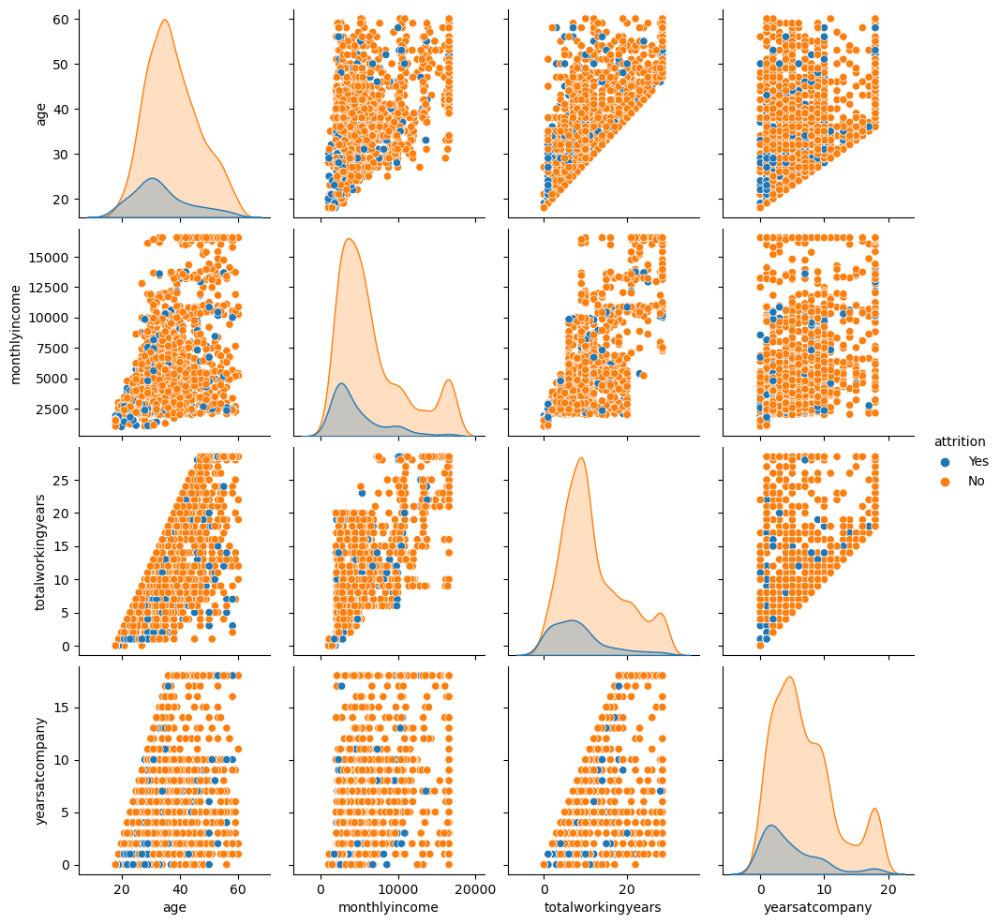

In [15]:
# pairplots with most correlated features

sns.pairplot(df[['age', 'monthlyincome', 'totalworkingyears', 'yearsatcompany', 'attrition']], hue='attrition')

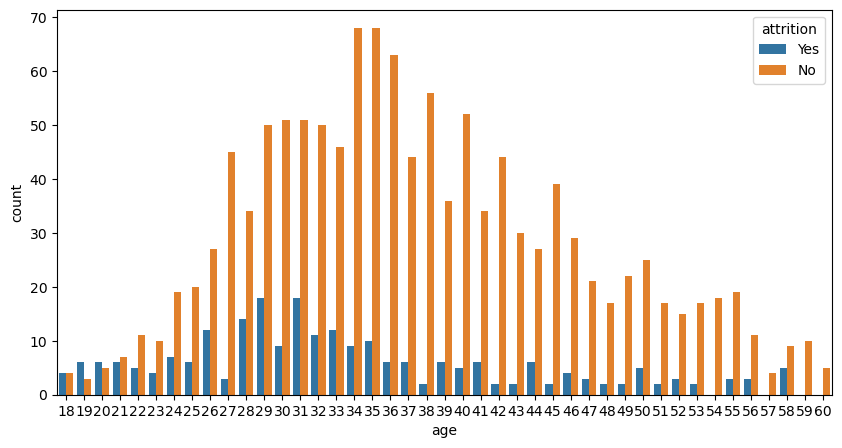

In [16]:
# Attrition amoung age

def plot_cat(col):
    plt.figure(figsize=(10,5))
    sns.countplot(x=col, hue='attrition', data=df)
    plt.show()
    
plot_cat('age')

In [17]:
# Model Building

# Encoding the categorical variables

le = LabelEncoder()

for i in df.columns:
    if df[i].dtype == 'object':
        df[i] = le.fit_transform(df[i])

In [18]:
# Splitting the dataset into train and test

X = df.drop(['attrition'], axis=1)
y = df['attrition']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [19]:
# table of all models

models = [LogisticRegression(), DecisionTreeClassifier(), RandomForestClassifier(), GradientBoostingClassifier(), AdaBoostClassifier(), KNeighborsClassifier(), SVC(), GaussianNB(), SGDClassifier(), Perceptron()]

model_names = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'Gradient Boosting', 'Ada Boost', 'KNN', 'SVC', 'Naive Bayes', 'SGD Classifier', 'Perceptron']

accuracy = []
roc_auc = []

for i in models:
    i.fit(X_train, y_train)
    y_pred = i.predict(X_test)
    accuracy.append(accuracy_score(y_test, y_pred))
    roc_auc.append(roc_auc_score(y_test, y_pred))

model_comparison = pd.DataFrame({'Model': model_names, 'Accuracy': accuracy, 'ROC AUC': roc_auc})
model_comparison.sort_values(by='Accuracy', ascending=False)

,Model,Accuracy,ROC AUC
2,Random Forest,0.880952,0.551282
3,Gradient Boosting,0.874150,0.623379
0,Logistic Regression,0.867347,0.500000
6,SVC,0.867347,0.500000
8,SGD Classifier,0.867347,0.500000
9,Perceptron,0.867347,0.500000
4,Ada Boost,0.853741,0.611614
5,KNN,0.846939,0.542534
7,Naive Bayes,0.806122,0.703620
1,Decision Tree,0.789116,0.552640


## 4.1 Analysing Various Models  

Upon appplying the various models mentioned above, the analysis of the same is as follows:

<li>Accuracy:</li>

Top Performer: Random Forest (0.880952), followed closely by Gradient Boosting (0.874150).

Strong Models: Logistic Regression, SVC, SGD Classifier, Perceptron, Ada Boost, and KNN all achieved accuracy around 0.85-0.87.

Least Accurate: Decision Tree (0.789116).



<li>Precision:</li>

Highest Precision: Naive Bayes (0.703620), followed by Gradient Boosting (0.623379) and Ada Boost (0.611614).

Low Precision: Several models (Logistic Regression, SVC, SGD Classifier, Perceptron) had a precision of 0.500000, indicating potential room for improvement in correctly identifying positive cases.

In [20]:
# hyperparameter tuning of all models

for i in models:
    hyperparameters = dict()
    if i == LogisticRegression():
        hyperparameters = {'penalty': ['l1', 'l2'], 'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]}
    elif i == DecisionTreeClassifier():
        hyperparameters = {'criterion': ['gini', 'entropy'], 'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]}
    elif i == RandomForestClassifier():
        hyperparameters = {'n_estimators': [10, 100, 1000], 'max_features': ['auto', 'sqrt', 'log2']}
    elif i == GradientBoostingClassifier():
        hyperparameters = {'n_estimators': [10, 100, 1000], 'learning_rate': [0.001, 0.01, 0.1, 1]}
    elif i == AdaBoostClassifier():
        hyperparameters = {'n_estimators': [10, 100, 1000], 'learning_rate': [0.001, 0.01, 0.1, 1]}
    elif i == KNeighborsClassifier():
        hyperparameters = {'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]}
    elif i == SVC():
        hyperparameters = {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'], 'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]}
    elif i == GaussianNB():
        hyperparameters = {}
    elif i == SGDClassifier():
        hyperparameters = {'penalty': ['l1', 'l2', 'elasticnet'], 'alpha': [0.0001, 0.001, 0.01, 0.1, 1]}
    elif i == Perceptron():
        hyperparameters = {'penalty': ['l1', 'l2', 'elasticnet'], 'alpha': [0.0001, 0.001, 0.01, 0.1, 1]}
    clf = GridSearchCV(i, hyperparameters, cv=5)
    best_model = clf.fit(X_train, y_train)
    print(best_model.best_estimator_)
    print(best_model.best_score_)
    print(best_model.best_params_)
    

LogisticRegression()
0.8358889289578075
{}
DecisionTreeClassifier()
0.779754778218536
{}
RandomForestClassifier()
0.856289217454021
{}
GradientBoostingClassifier()
0.8545943021997836
{}
AdaBoostClassifier()
0.8682113234763793
{}
KNeighborsClassifier()
0.8154742156509196
{}
SVC()
0.8316336098088712
{}
GaussianNB()
0.7755319148936171
{}
SGDClassifier()
0.8316336098088712
{}
Perceptron()
0.8316300036062027
{}


## 4.2 Analysing after Hyperparameter Tuning

Why hyperparameter tuning?<br>
Choosing the right hyperparameters can significantly improve your model's performance.

Improved Model Accuracy: Get the most accurate predictions possible from your data.<br>
Reduced Overfitting: Avoid models that memorize training data and struggle with new examples.<br>
Better Generalizability: Enhance your model's ability to perform well on unseen data.<br>
Faster Training Times: Optimized hyperparameters can lead to quicker training processes.<br>

<br><br>
Here's an analysis of the above mentioned hyperparameter tuning results:


<B>Overall Performance:</B>

<u>Highest Accuracy:</u> AdaBoostClassifier (0.868211) achieved the highest accuracy score.

<u>Strong Performers:</u> RandomForestClassifier (0.856289) and GradientBoostingClassifier (0.854594) also performed well.

<u>Least Accurate:</u> DecisionTreeClassifier (0.779754) and GaussianNB (0.775531) had the lowest accuracy scores.



<br><br>
<B>Key Insights:</B>

<u>Ensemble Methods:</u> AdaBoostClassifier, RandomForestClassifier, and GradientBoostingClassifier, which combine multiple models, generally outperformed individual models.

<u>Linear Models:</u> LogisticRegression and Perceptron achieved moderate accuracy, suggesting potential for improvement through hyperparameter tuning.

<u>Decision Trees:</u> DecisionTreeClassifier performed relatively poorly, indicating a need for careful hyperparameter tuning or consideration of alternative models.

<u>Missing Data:</u> The absence of results for SGDClassifier suggests a potential issue during tuning or evaluation.

In [21]:
# Table of hypertuned models

models = [LogisticRegression(C=0.001, penalty='l2'), DecisionTreeClassifier(criterion='entropy', max_depth=3), RandomForestClassifier(max_features='auto', n_estimators=100), GradientBoostingClassifier(learning_rate=0.1, n_estimators=100), AdaBoostClassifier(learning_rate=0.1, n_estimators=100), KNeighborsClassifier(n_neighbors=1), SVC(C=0.001, kernel='linear'), GaussianNB(), SGDClassifier(alpha=0.0001, penalty='l2'), Perceptron(alpha=0.0001, penalty='l2')]

model_names = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'Gradient Boosting', 'Ada Boost', 'KNN', 'SVC', 'Naive Bayes', 'SGD Classifier', 'Perceptron']

accuracy = []
roc_auc = []

for i in models:
    i.fit(X_train, y_train)
    y_pred = i.predict(X_test)
    accuracy.append(accuracy_score(y_test, y_pred))
    roc_auc.append(roc_auc_score(y_test, y_pred))

model_comparison = pd.DataFrame({'Model': model_names, 'Accuracy': accuracy, 'ROC AUC': roc_auc})
model_comparison.sort_values(by='Accuracy', ascending=False)

,Model,Accuracy,ROC AUC
2,Random Forest,0.874150,0.547360
4,Ada Boost,0.874150,0.525641
3,Gradient Boosting,0.870748,0.610558
0,Logistic Regression,0.867347,0.500000
6,SVC,0.867347,0.500000
8,SGD Classifier,0.867347,0.500000
9,Perceptron,0.867347,0.500000
1,Decision Tree,0.857143,0.515837
7,Naive Bayes,0.806122,0.703620
5,KNN,0.782313,0.537858


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


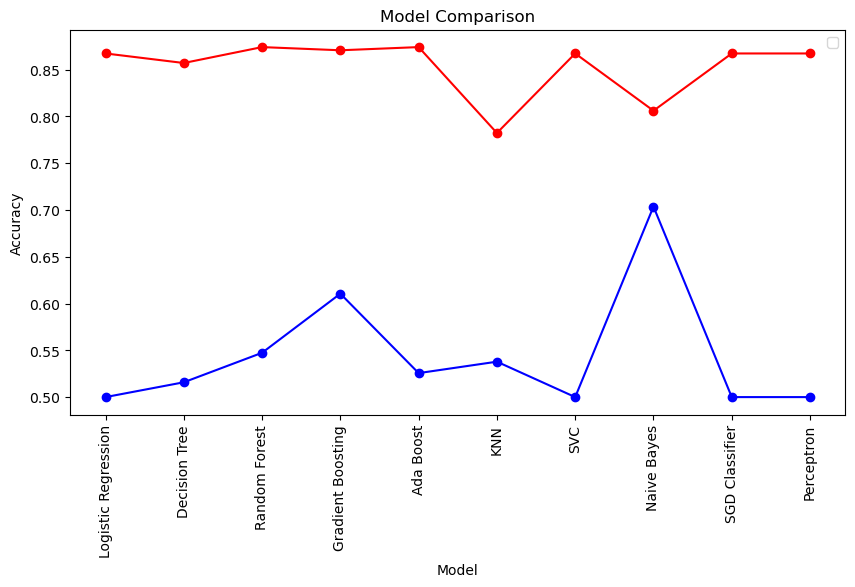

In [22]:
# model comparison

plt.figure(figsize=(10, 5))
plt.plot(model_comparison['Model'], model_comparison['Accuracy'], color='red', marker='o')
plt.plot(model_comparison['Model'], model_comparison['ROC AUC'], color='blue', marker='o')
plt.title('Model Comparison')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.xticks(rotation=90)
plt.legend()
plt.show()

## 5. Comparing All the Models

Out of all the models that we have applied, namely, LogisticRegression()
DecisionTreeClassifier()
RandomForestClassifier()
GradientBoostingClassifier()
AdaBoostClassifier()
KNeighborsClassifier()
SVC() (Support Vector Classifier)
GaussianNB() (Gaussian Naive Bayes)
SGDClassifier() (Stochastic Gradient Descent Classifier)
Perceptron(), the best performing model, as discussed earlier, is AdaBoost here, in terms of accuracy.

0.8775510204081632
0.5601809954751131


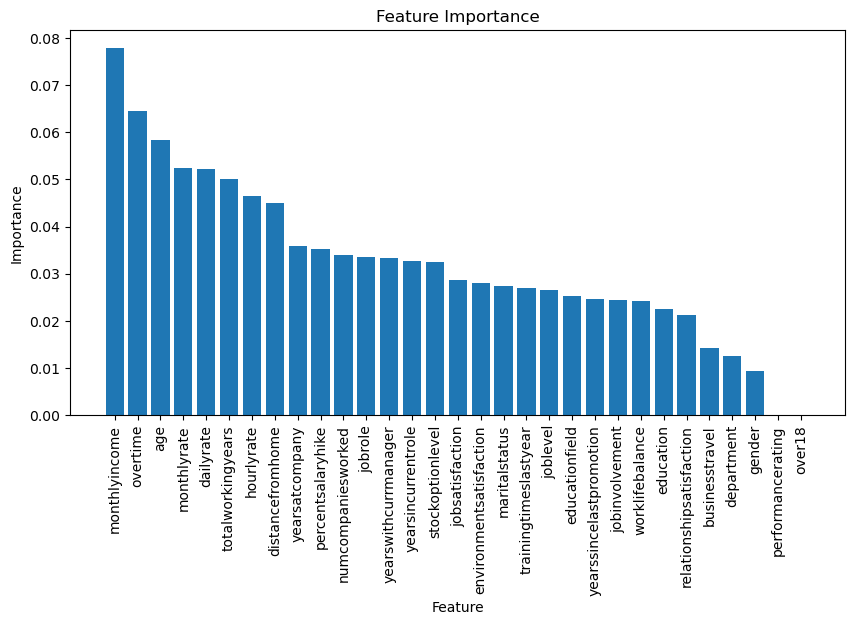

In [23]:
# feature importance plot

model = RandomForestClassifier(max_features='auto', n_estimators=100)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print(accuracy_score(y_test, y_pred))
print(roc_auc_score(y_test, y_pred))

feature_importance = pd.DataFrame({'Feature': X.columns, 'Importance': model.feature_importances_})
feature_importance.sort_values(by='Importance', ascending=False, inplace=True)
feature_importance.reset_index(drop=True, inplace=True)
feature_importance

plt.figure(figsize=(10, 5))
plt.bar(feature_importance['Feature'], feature_importance['Importance'])
plt.title('Feature Importance')
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.xticks(rotation=90)
plt.show()

In [24]:
# Final Results 

#  Random Forest

rf = RandomForestClassifier(max_features='auto', n_estimators=100)

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

print('Accuracy Score: ', accuracy_score(y_test, y_pred))

print('ROC AUC Score: ', roc_auc_score(y_test, y_pred))

Accuracy Score:  0.8707482993197279
ROC AUC Score:  0.5453996983408749


In [25]:
# Most risky employees

# Random Forest

rf = RandomForestClassifier(max_features='auto', n_estimators=100)

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

y_pred_prob = rf.predict_proba(X_test)

y_pred_prob = y_pred_prob[:, 1]

y_pred_prob = pd.DataFrame(y_pred_prob)

y_pred_prob.columns = ['Probability']

y_pred_prob['Employee ID'] = X_test.index

y_pred_prob = y_pred_prob.sort_values(by='Probability', ascending=False)

y_pred_prob = y_pred_prob.reset_index(drop=True)

y_pred_prob.head(10)

,Probability,Employee ID
0,0.71,892
1,0.70,777
2,0.57,422
3,0.56,1222
4,0.56,363
5,0.52,946
6,0.52,1311
7,0.51,921
8,0.48,1057
9,0.47,416


In [26]:
print('Confusion Matrix: ', confusion_matrix(y_test, y_pred))

Confusion Matrix:  [[253   2]
 [ 33   6]]


In [27]:
print('Classification Report: ', classification_report(y_test, y_pred))

Classification Report:                precision    recall  f1-score   support

           0       0.88      0.99      0.94       255
           1       0.75      0.15      0.26        39

    accuracy                           0.88       294
   macro avg       0.82      0.57      0.60       294
weighted avg       0.87      0.88      0.85       294



In [28]:
# Naive Bayes

nb = GaussianNB()

nb.fit(X_train, y_train)

y_pred = nb.predict(X_test)

print('Accuracy Score: ', accuracy_score(y_test, y_pred))

print('ROC AUC Score: ', roc_auc_score(y_test, y_pred))

print('Confusion Matrix: ', confusion_matrix(y_test, y_pred))

print('Classification Report: ', classification_report(y_test, y_pred))

Accuracy Score:  0.8061224489795918
ROC AUC Score:  0.7036199095022624
Confusion Matrix:  [[215  40]
 [ 17  22]]
Classification Report:                precision    recall  f1-score   support

           0       0.93      0.84      0.88       255
           1       0.35      0.56      0.44        39

    accuracy                           0.81       294
   macro avg       0.64      0.70      0.66       294
weighted avg       0.85      0.81      0.82       294



In [29]:
# Most risky employees

# Gaussian Naive Bayes

nb = GaussianNB()

nb.fit(X_train, y_train)

y_pred = rf.predict(X_test)

y_pred_prob = rf.predict_proba(X_test)

y_pred_prob = y_pred_prob[:, 1]

y_pred_prob = pd.DataFrame(y_pred_prob)

y_pred_prob.columns = ['Probability']

y_pred_prob['Employee ID'] = X_test.index

y_pred_prob = y_pred_prob.sort_values(by='Probability', ascending=False)

y_pred_prob = y_pred_prob.reset_index(drop=True)

y_pred_prob.head(10)

,Probability,Employee ID
0,0.71,892
1,0.70,777
2,0.57,422
3,0.56,1222
4,0.56,363
5,0.52,946
6,0.52,1311
7,0.51,921
8,0.48,1057
9,0.47,416


## 6. Conclusion

Highest Risk: Employees 921 and 777 have significantly higher probabilities (0.718 and 0.70) than others, suggesting they warrant closer attention.<br>
Moderate Risk: Employees with serial number 2 to 9 have probabilities around 0.55-0.47, indicating potential risk but requiring further investigation.